# GoW corpus (W+J)

In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import spacy
nlp = spacy.load('en')
from nltk.corpus import stopwords
from nltk import sent_tokenize
from nltk import word_tokenize
import numpy as np
import re
import string
import itertools
import json
import statistics
import numpy.linalg as la
import scipy.cluster.vq as vq
import random
from collections import Counter
data=open('stopwords.txt','r')
data_read = data.read()
stop_words=data_read.replace('\n',' ').split()

## funcion que limpia los textos

In [2]:
def clean(text,noun_adj): 
    text=re.sub("[\(\[].*?[\)\]]", "", text)
    text=text.replace('al.','')
    sentences=sent_tokenize(text)
    sentences=[nlp(sentence.lower()) for sentence in sentences] 
    
    if noun_adj==True:
        sentences=[[token.lemma_ for token in sentence if token.tag_=='NN' or token.tag_=='NNS' or token.tag_=='JJ'] for sentence in sentences]
    else:
        sentences=[[token.lemma_ for token in sentence if token.lemma_ != '-PRON-' and token.is_punct==False and token.like_num==False] for sentence in sentences]

    sentences=[[word for word in sentence if not word in stop_words] for sentence in sentences]
    sentences=[[(re.sub(r'[^a-zA-Z0-9]', '', word)) for word in sentence] for sentence in sentences]  
    sentences=[[word for word in sentence if word.isdigit()==False and word!=''] for sentence in sentences]
    sentences=[sentence for sentence in sentences if len(sentence)>1]
    
    return sentences

## ejemplo

In [3]:
text='Sequencing the Neanderthal genome (Green et al., 2010, Prüfer et al., 2014), the Denisovan genome (Reich et al., 2010), and several early modern human genomes from Eurasia (Fu et al., 2014, Fu et al., 2015) has confirmed that archaic hominins left their mark in the genomes of modern humans (Plagnol and Wall, 2006, Sankararaman et al., 2014, Vernot and Akey, 2014, Vernot et al., 2016). Present-day individuals in Eurasia inherited ∼2% of their genome from Neanderthals (Green et al., 2010), and individuals from Oceania inherited ∼5% of their genome from Denisovans (Reich et al., 2010). Suggestive evidence indicates that admixture from other unidentified hominin species occurred in Africa (Hammer et al., 2011, Hsieh et al., 2016, Lachance et al., 2012, Plagnol and Wall, 2006, Wall et al., 2009). To understand the functional, phenotypic, and evolutionary consequences of archaic admixture, it is necessary to identify the specific haplotypes and alleles that were inherited from archaic hominin ancestors (Huerta-Sánchez et al., 2014, Juric et al., 2016, Sankararaman et al., 2014, Simonti et al., 2016, Vernot and Akey, 2014). Approaches to identifying introgressed haplotypes include methods that specifically incorporate reference archaic hominin genome sequences and reference-free methods that do not utilize such information. An example of the former category is the method of Sankararaman et al. (2014), which identifies archaic haplotypes by comparing modern human haplotypes to a reference archaic sequence. The latter category of methods include the S∗ statistic (Plagnol and Wall, 2006), which searches for the mutational signature that ancient admixture leaves in the genomes of present-day humans. The S∗ approach is powerful for finding introgressed haplotypes in the absence of an archaic reference genome because it leverages the unusual mutational characteristics of introgressed haplotypes. Because of the long divergence time between Neanderthals and modern humans, Neanderthals carry many alleles that are specific to their lineage. Such alleles are present on introgressed haplotypes but are absent or rare in African genomes. Further, based on the recent timing of admixture, introgressed haplotypes are expected to be maintained without recombination over distances of approximately 50 kb on average (Sankararaman et al., 2012), resulting in high levels of linkage disequilibrium (LD) between Neanderthal-specific alleles in non-African human genomes. In this study, we develop an S∗-like method that has increased power and is suitable for large-scale genome-wide data. We apply the method to large sets of sequenced data from Eurasia and Oceania and identify putative archaic-specific alleles. We examine the rate at which these alleles match the sequenced archaic genomes and the role of the genes containing these alleles, to obtain insights into the history of the admixture events and their impact on modern human genomes.'
text_clean=clean(text,True)
text_clean

[['neanderthal',
  'genome',
  'denisovan',
  'genome',
  'early',
  'modern',
  'human',
  'genome',
  'eurasia',
  'archaic',
  'hominin',
  'mark',
  'genome',
  'modern',
  'human'],
 ['present',
  'day',
  'individual',
  'eurasia',
  'genome',
  'neanderthal',
  'individual',
  'oceania',
  'genome',
  'denisovan'],
 ['suggestive', 'evidence', 'unidentified', 'hominin', 'specie', 'africa'],
 ['functional',
  'phenotypic',
  'evolutionary',
  'consequence',
  'archaic',
  'admixture',
  'specific',
  'haplotype',
  'allele',
  'archaic',
  'hominin',
  'ancestor'],
 ['approach',
  'introgressed',
  'haplotype',
  'method',
  'reference',
  'archaic',
  'hominin',
  'genome',
  'sequence',
  'reference',
  'free',
  'method',
  'information'],
 ['category',
  'method',
  'sankararaman',
  'haplotype',
  'modern',
  'human',
  'haplotype',
  'reference',
  'archaic',
  'sequence'],
 ['category',
  'method',
  's',
  'statistic',
  'mutational',
  'signature',
  'ancient',
  'admixtu

## grafo de palabras
### https://pdfs.semanticscholar.org/6c5f/e85468b488e5d000b62596d89e313906b733.pdf?_ga=2.78701266.738419600.1525701802-2082719092.1515592461

In [4]:
def graph(text_clean):
    G=nx.Graph()
    for sentence in text_clean:
        unique_words=list(set(sentence))
        for word in unique_words:
            if word not in G:
                G.add_node(word)
        pairs=list(itertools.combinations(unique_words,2)) ## sin repeticion!
        for pair in pairs:
            if G.has_edge(pair[0],pair[1])==False:
                G.add_edge(pair[0],pair[1],weight=1/float(len(unique_words)-1))
            else:
                x=G[pair[0]][pair[1]]['weight']
                G[pair[0]][pair[1]]['weight']=x+1/float(len(unique_words)-1)  
        
    return G

In [5]:
G=graph(text_clean)

In [6]:
G

## experimento corpus introducciones CELL + NEURON

In [7]:
data_cell = json.load(open('cell_full_xml.json'))
data_neuron =  json.load(open('neuron_full_xml.json'))
data_cell_metabolism= json.load(open('cell_metabolism_full_xml.json'))
data_immunity= json.load(open('immunity_full_xml.json'))
#data_cell=data_cell+data_neuron+data_cell_metabolism+data_immunity

def paragraphs(paper):
    text=[]
    if len(paper['subsections'])==0:
        return ' '.join(paper['paragraphs'])

def extract_intro(paper):
    return paper['sections'][0]

cell=[paragraphs(extract_intro(data_cell[i])) for i in range(len(data_cell)) if len(data_cell[i]['sections'])>1]
cell=[paper for paper in cell if type(paper)!='NoneType']

neuron=[paragraphs(extract_intro(data_neuron[i])) for i in range(len(data_neuron)) if len(data_neuron[i]['sections'])>1]
neuron=[paper for paper in neuron if type(paper)!='NoneType']

In [8]:
len(cell)

2118

In [9]:
len(neuron)

1671

In [10]:
cell_text=''
for text in cell:
    try:
        cell_text+=text
    except TypeError:
        pass

In [11]:
cell_text

'The purine nucleoside, adenosine, is a vital cytoprotective molecule mediating effects through activation of four subtypes of Class A G-protein-coupled receptors (GPCRs), the A  1 , A 2A , A 2B , and A 3 adenosine receptors (ARs) ( __REF  Fredholm et\xa0al., 2011 REF__  ). Given the broad distribution of ARs in the central nervous system and the periphery, strategies for enhancing or inhibiting the activity of ARs have been pursued for potential treatments of disorders associated with cardiovascular function, blood flow, anxiety, dementia, Parkinson’s disease, pain, respiration, sleep, inflammation, and immunity ( __REF  Jacobson and Gao, 2006 REF__  ). Nonetheless, very few AR drug candidates have successfully progressed through clinical trials. One reason for this failure is the widespread distribution of ARs. If a drug candidate has insufficient selectivity for a given AR subtype, then the potential exists for off-target side-effects ( __REF  Chen et\xa0al., 2013 REF__  ). Even whe

In [12]:
neuron_text=''
for text in neuron:
    try:
        neuron_text+=text
    except TypeError:
        pass

In [13]:
neuron_text

"By forming and executing plans, humans can engage in complex behaviors such as preparing a cup of coffee or organizing a trip to London. When asked to perform multistep tasks such as these, patients with lesions to the prefrontal cortex (PFC) often exhibit disordered action sequences that fail to achieve the specified goal (  __REF  Owen et\xa0al., 1990; Shallice, 1982; Shallice and Burgess, 1991 REF__  ), and hippocampal patients have difficulty imagining the future states entailed ( __REF  Schacter et\xa0al., 2012 REF__  ). Moreover, functional neuroimaging has confirmed the involvement of human prefrontal and limbic structures in forming and executing plans, particularly in spatial environments ( __REF  Howard et\xa0al., 2014; Schacter and Addis, 2007; Unterrainer and Owen, 2006 REF__  ). Nevertheless, linking these macroscopic neural findings to the underlying computational mechanisms that subserve planning remains an open challenge for psychologists and neuroscientists. Planning 

In [14]:
cell_text=clean(cell_text,True)

In [15]:
len(cell_text)

46614

In [16]:
cell_text=[text for text in cell_text if len(text)>1]

In [17]:
len(cell_text)

46614

In [18]:
neuron_text=clean(neuron_text,True)

In [19]:
len(neuron_text)

35914

In [20]:
neuron_text=[text for text in neuron_text if len(text)>1]

In [21]:
len(neuron_text)

35914

### grafo de la revista y estadisticas basicas

### cell

In [22]:
G_cell=graph(cell_text)

In [23]:
## number nodes
len(G_cell.nodes) 

23275

In [24]:
## number edges
len(G_cell.edges)

1365498

In [25]:
## average degree
sum(dict(nx.degree(G_cell,weight='weight')).values())/float(len(G_cell.nodes))

21.191879699248094

In [26]:
## max degree
max(dict(nx.degree(G_cell,weight='weight')).values())

9193.000000000879

In [27]:
## core y max core number
core_number_cell=nx.core_number(G_cell)
max(core_number_cell.values())

363

### neuron

In [28]:
G_neuron=graph(neuron_text)

In [29]:
## number nodes
len(G_neuron.nodes) 

15507

In [30]:
## number edges
len(G_neuron.edges)

1018118

In [31]:
## average degree
sum(dict(nx.degree(G_neuron,weight='weight')).values())/float(len(G_neuron.nodes))

25.362803895015087

In [32]:
## max degree
max(dict(nx.degree(G_neuron,weight='weight')).values())

5968.000000000096

In [33]:
## core y max core number
core_number_neuron=nx.core_number(G_neuron)
max(core_number_neuron.values())

337

### k core decomposition

### cell

In [34]:
## elegimos algunos valores 
K=list(set(core_number_cell.values()))

In [35]:
k_core_decomposition=[]

for k in [1,50,100,150,200,250,300,363]:
    print(k)
    k_core_decomposition+=[nx.k_core(G_cell,k=k)]

1
50
100
150
200
250
300
363


In [36]:
k_core_decomposition

### neuron

In [37]:
## elegimos algunos valores 
K_neuron=list(set(core_number_neuron.values()))

In [39]:
k_core_decomposition_neuron=[]

for k in [1,50,100,150,200,250,300,337]:
    print(k)
    k_core_decomposition_neuron+=[nx.k_core(G_neuron,k=k)]

1
50
100
150
200
250
300
337


In [40]:
k_core_decomposition_neuron

### degree distribution para distintos k core

### cell

In [41]:
## degree sequence
degree_sequence=[]
for graph in k_core_decomposition:
    #graph=nx.maximum_spanning_tree(graph)
    d=list(dict(nx.degree(graph,weight='weight')).values())
    d=[x/float(np.mean(d)) for x in sorted(d)]
    degree_sequence+=[(d,[x/float(max(np.cumsum(d))) for x in sorted(list(np.cumsum(d)),reverse=True)])]

In [42]:
len(degree_sequence[0])

2

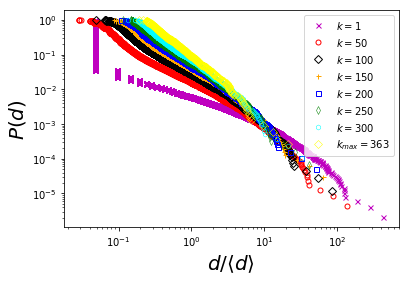

In [43]:
plt.plot(degree_sequence[0][0],degree_sequence[0][1],'m',marker='x',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=1$')
plt.plot(degree_sequence[1][0],degree_sequence[1][1],'r',marker='o',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=50$')
plt.plot(degree_sequence[2][0],degree_sequence[2][1],'k',marker='D',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=100$')
plt.plot(degree_sequence[3][0],degree_sequence[3][1],'orange',marker='+',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=150$')
plt.plot(degree_sequence[4][0],degree_sequence[4][1],'b',marker='s',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=200$')
plt.plot(degree_sequence[5][0],degree_sequence[5][1],'green',marker='d',markersize=5,fillstyle='none',markeredgewidth=0.5,clip_on=False,linewidth=0,label=r'$k=250$')
plt.plot(degree_sequence[6][0],degree_sequence[6][1],'cyan',marker='h',markersize=5,fillstyle='none',markeredgewidth=0.5,clip_on=False,linewidth=0,label=r'$k=300$')
plt.plot(degree_sequence[7][0],degree_sequence[7][1],'yellow',marker='D',markersize=5,fillstyle='none',markeredgewidth=0.5,clip_on=False,linewidth=0,label=r'$k_{max}=363$')

plt.xscale('log')
plt.yscale('log')
plt.legend(loc='best')
plt.ylabel(r'$P(d)$',fontsize=20)
plt.xlabel(r'$d/ \langle d \rangle$',fontsize=20)
plt.rcParams.update({'font.size': 10})
plt.savefig('degree_distribution.eps', format='eps', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

### neuron

In [45]:
## degree sequence
degree_sequence_neuron=[]
for graph in k_core_decomposition_neuron:
    #graph=nx.maximum_spanning_tree(graph)
    d=list(dict(nx.degree(graph,weight='weight')).values())
    d=[x/float(np.mean(d)) for x in sorted(d)]
    degree_sequence_neuron+=[(d,[x/float(max(np.cumsum(d))) for x in sorted(list(np.cumsum(d)),reverse=True)])]

In [46]:
len(degree_sequence_neuron[0])

2

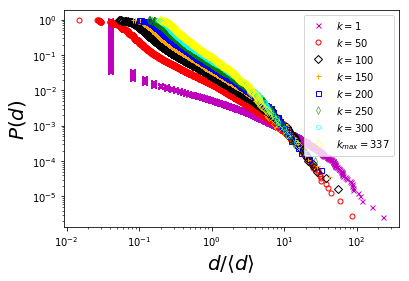

In [48]:
plt.plot(degree_sequence_neuron[0][0],degree_sequence_neuron[0][1],'m',marker='x',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=1$')
plt.plot(degree_sequence_neuron[1][0],degree_sequence_neuron[1][1],'r',marker='o',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=50$')
plt.plot(degree_sequence_neuron[2][0],degree_sequence_neuron[2][1],'k',marker='D',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=100$')
plt.plot(degree_sequence_neuron[3][0],degree_sequence_neuron[3][1],'orange',marker='+',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=150$')
plt.plot(degree_sequence_neuron[4][0],degree_sequence_neuron[4][1],'b',marker='s',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0,label=r'$k=200$')
plt.plot(degree_sequence_neuron[5][0],degree_sequence_neuron[5][1],'green',marker='d',markersize=5,fillstyle='none',markeredgewidth=0.5,clip_on=False,linewidth=0,label=r'$k=250$')
plt.plot(degree_sequence_neuron[6][0],degree_sequence_neuron[6][1],'cyan',marker='h',markersize=5,fillstyle='none',markeredgewidth=0.5,clip_on=False,linewidth=0,label=r'$k=300$')
plt.plot(degree_sequence_neuron[7][0],degree_sequence_neuron[7][1],'yellow',marker='D',markersize=5,fillstyle='none',markeredgewidth=0.5,clip_on=False,linewidth=0,label=r'$k_{max}=337$')

plt.xscale('log')
plt.yscale('log')
plt.legend(loc='best')
plt.ylabel(r'$P(d)$',fontsize=20)
plt.xlabel(r'$d/ \langle d \rangle$',fontsize=20)
plt.rcParams.update({'font.size': 10})
plt.savefig('degree_distribution_neuron.eps', format='eps', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

### k shell decomposition

### cell

In [67]:
k_shell_decomposition_cell=[]

for k in [1,50,100,150,200,250,300,362,363]:
    print(k)
    k_shell_decomposition_cell+=[nx.k_shell(G_cell,k=k)]

1
50
100
150
200
250
300
362
363


### neuron

In [68]:
k_shell_decomposition_neuron=[]

for k in [1,50,100,150,200,250,300,336,337]:
    print(k)
    k_shell_decomposition_neuron+=[nx.k_shell(G_neuron,k=k)]

1
50
100
150
200
250
300
336
337


### k shell size distribution

### cell

In [69]:
## k shell size
k_shell_size_cell=[]
for graph in k_shell_decomposition_cell:
    k_shell_size_cell+=[len(graph.nodes())]

In [70]:
k_shell_size_cell

[6, 94, 19, 18, 15, 8, 5, 6, 700]

### neuron

In [71]:
## k shell size
k_shell_size_neuron=[]
for graph in k_shell_decomposition_neuron:
    k_shell_size_neuron+=[len(graph.nodes())]

In [72]:
k_shell_size_neuron

[11, 70, 30, 13, 4, 14, 4, 6, 691]

### k shell size distribution plot

### cell

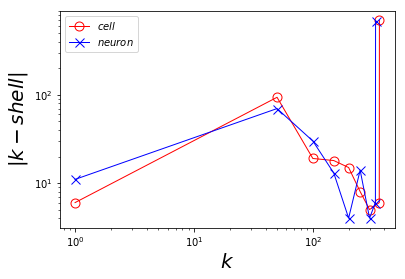

In [73]:
plt.plot([1,50,100,150,200,250,300,362,363],k_shell_size_cell,'r',marker='o',markersize=9,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=1,label=r'$cell$')
plt.plot([1,50,100,150,200,250,300,336,337],k_shell_size_neuron,'b',marker='x',markersize=9,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=1,label=r'$neuron$')

plt.xscale('log')
plt.yscale('log')
plt.legend(loc='best')
plt.ylabel(r'$|k-shell|$',fontsize=20)
plt.xlabel(r'$k$',fontsize=20)
plt.rcParams.update({'font.size': 10})
plt.savefig('k_shell.eps', format='eps', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

### spectral clustering

### cell

In [94]:
MC_cell=k_core_decomposition[len(k_core_decomposition)-1]

In [95]:
len(MC_cell)

491

In [107]:
MC_cell=nx.maximum_spanning_tree(MC_cell)

In [108]:
coord = nx.spring_layout(MC_cell, iterations=1000)

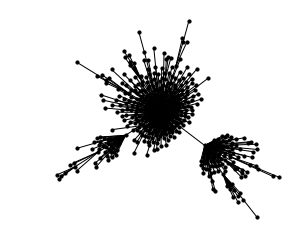

In [144]:
fig = plt.figure()
axs = fig.add_subplot(111, aspect='equal')
axs.axis('off')
nx.draw_networkx_edges(MC_cell, coord)
nx.draw_networkx_nodes(MC_cell, coord,node_size=10,node_color='k')
plt.show()

In [145]:
A = nx.adjacency_matrix(MC_cell)
D = np.diag(np.ravel(np.sum(A,axis=1)))
L = D - A
l, U = la.eigh(L)

In [146]:
f = U[:,1]
labels = np.ravel(np.sign(f))

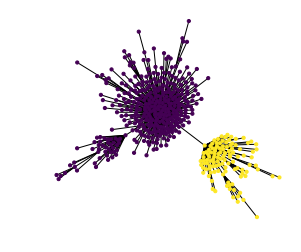

In [147]:
fig = plt.figure()
axs = fig.add_subplot(111, aspect='equal')
axs.axis('off')
nx.draw_networkx_edges(MC_cell, coord)
nx.draw_networkx_nodes(MC_cell, coord,node_size=10,node_color=labels)
plt.show()

In [148]:
k = 3
means, labels = vq.kmeans2(U[:,1:k], k)

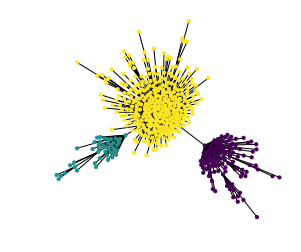

In [149]:
fig = plt.figure()
axs = fig.add_subplot(111, aspect='equal')
axs.axis('off')
nx.draw_networkx_edges(MC_cell, coord)
nx.draw_networkx_nodes(MC_cell, coord,node_size=10,node_color=labels)
plt.show()

### neuron

In [150]:
MC_neuron=k_core_decomposition_neuron[len(k_core_decomposition_neuron)-1]

In [151]:
len(MC_neuron)

488

In [152]:
MC_neuron=nx.maximum_spanning_tree(MC_neuron)

In [153]:
coord = nx.spring_layout(MC_neuron, iterations=1000)

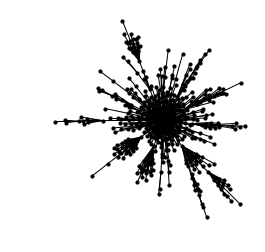

In [154]:
fig = plt.figure()
axs = fig.add_subplot(111, aspect='equal')
axs.axis('off')
nx.draw_networkx_edges(MC_neuron, coord)
nx.draw_networkx_nodes(MC_neuron, coord,node_size=10,node_color='k')
plt.show()

In [155]:
A = nx.adjacency_matrix(MC_neuron)
D = np.diag(np.ravel(np.sum(A,axis=1)))
L = D - A
l, U = la.eigh(L)

In [156]:
f = U[:,1]
labels = np.ravel(np.sign(f))

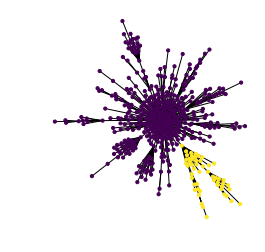

In [157]:
fig = plt.figure()
axs = fig.add_subplot(111, aspect='equal')
axs.axis('off')
nx.draw_networkx_edges(MC_neuron, coord)
nx.draw_networkx_nodes(MC_neuron, coord,node_size=10,node_color=labels)
plt.show()

In [158]:
k = 3
means, labels = vq.kmeans2(U[:,1:k], k)

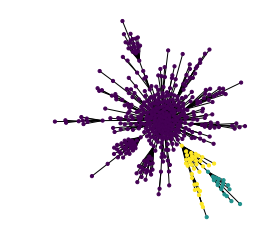

In [159]:
fig = plt.figure()
axs = fig.add_subplot(111, aspect='equal')
axs.axis('off')
nx.draw_networkx_edges(MC_neuron, coord)
nx.draw_networkx_nodes(MC_neuron, coord,node_size=10,node_color=labels)
plt.show()